In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go 
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
import seaborn as sns
import datetime as dt
import warnings
pd.set_option('display.max_columns',None)
init_notebook_mode(connected=True)


In [55]:
#import dataset
df1=pd.read_csv('../Datasets/water_potability.csv')

In [56]:
df1.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [57]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [58]:
df1.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [59]:
df1.duplicated().value_counts()

False    3276
Name: count, dtype: int64

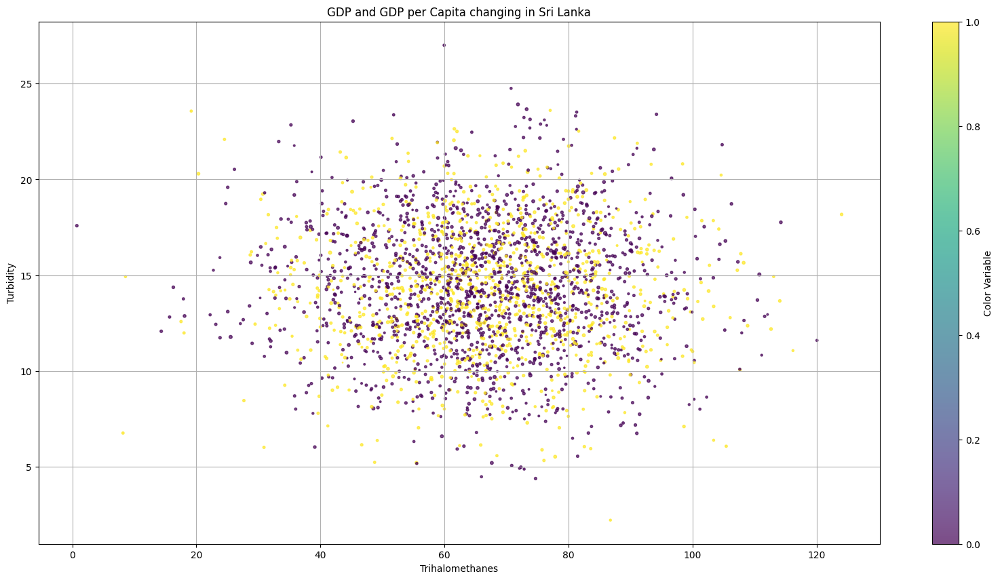

In [60]:
x = df1['Trihalomethanes']
y = df1['Organic_carbon']
sizes = df1['ph']  # Optional: Size of markers based on another variable
colors =df1['Potability'] # Optional: Color of markers based on another variable

# Scatter plot with customizations
plt.scatter(x, y, s=sizes, c=colors, alpha=0.7, cmap='viridis', marker='o')

# Add colorbar (if using color based on another variable)
plt.colorbar(label='Color Variable')

# Add labels and title
plt.xlabel('Trihalomethanes')
plt.ylabel('Turbidity')
plt.title('GDP and GDP per Capita changing in Sri Lanka')

#Add annotations or other customizations as needed

# Show plot
plt.grid(True)
plt.show()



In [61]:
df1=df1.round(2)

In [62]:
df1.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.89,20791.32,7.30,368.52,564.31,10.38,86.99,2.96,0
1,3.72,129.42,18630.06,6.64,NaN,592.89,15.18,56.33,4.50,0
2,8.10,224.24,19909.54,9.28,NaN,418.61,16.87,66.42,3.06,0
3,8.32,214.37,22018.42,8.06,356.89,363.27,18.44,100.34,4.63,0
4,9.09,181.10,17978.99,6.55,310.14,398.41,11.56,32.00,4.08,0


In [63]:
df1=df1.dropna()

In [64]:
df1.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.32,214.37,22018.42,8.06,356.89,363.27,18.44,100.34,4.63,0
4,9.09,181.10,17978.99,6.55,310.14,398.41,11.56,32.00,4.08,0
5,5.58,188.31,28748.69,7.54,326.68,280.47,8.40,54.92,2.56,0
6,10.22,248.07,28749.72,7.51,393.66,283.65,13.79,84.60,2.67,0
7,8.64,203.36,13672.09,4.56,303.31,474.61,12.36,62.80,4.40,0


In [65]:


# Filter records where Potability equals 0 and 1
potability_zero_df = df1[df1['Potability'] == 0]
potability_one_df = df1[df1['Potability'] == 1]



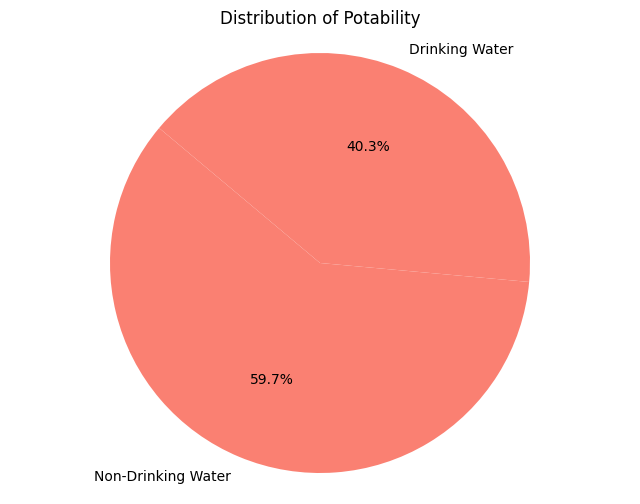

In [66]:

potability_counts = df1['Potability'].value_counts()

# Define custom labels for the potability values
potability_labels = {1: 'Drinking Water', 0: 'Non-Drinking Water'}

# Create a pie chart with custom appearance
plt.figure(figsize=(8, 6))  # Adjust figure size if needed
plt.pie(potability_counts, labels=potability_counts.index.map(potability_labels), autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Potability')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()


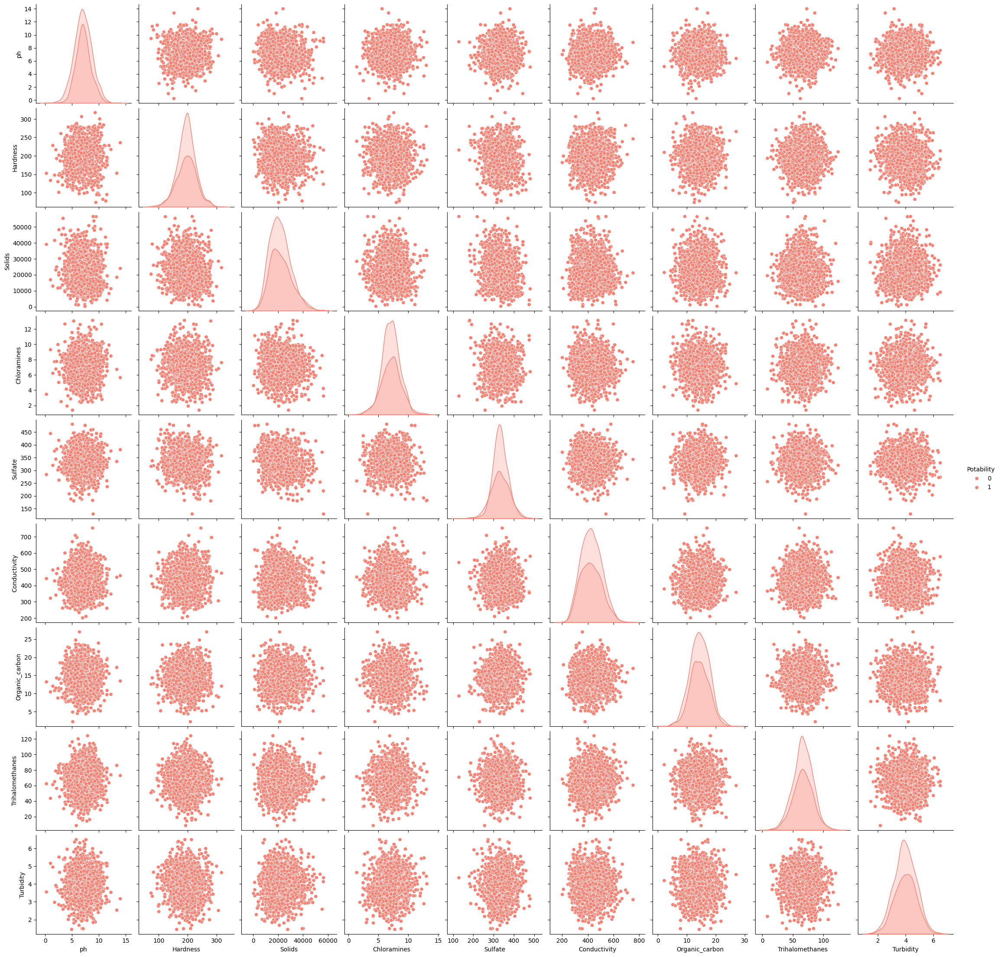

In [67]:
sns.pairplot(df1, hue="Potability")

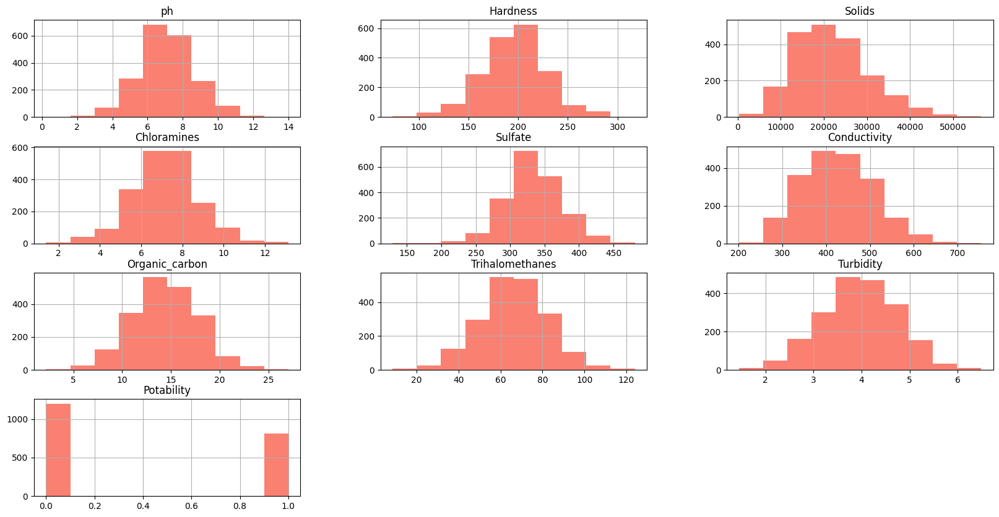

In [68]:
plt.rcParams['figure.figsize'] = [20,10]
df1.hist()
plt.show()

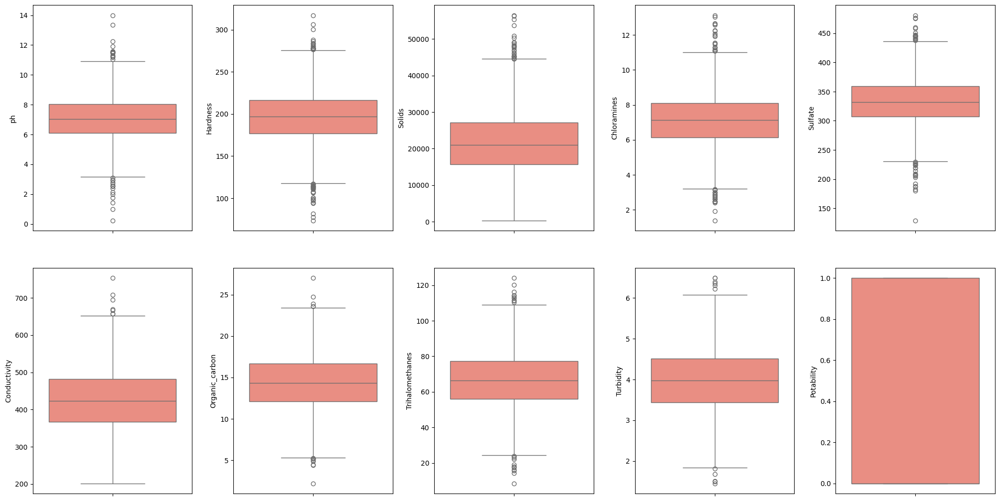

In [69]:
# Visualizing dataset and also checking for outliers 

fig, ax = plt.subplots(ncols = 5, nrows = 2, figsize = (20, 10))
index = 0
ax = ax.flatten()

for col, value in df1.items():
    sns.boxplot(y=col, data=df1, ax=ax[index])
    index += 1
plt.tight_layout(pad = 0.5, w_pad=0.7, h_pad=5.0)

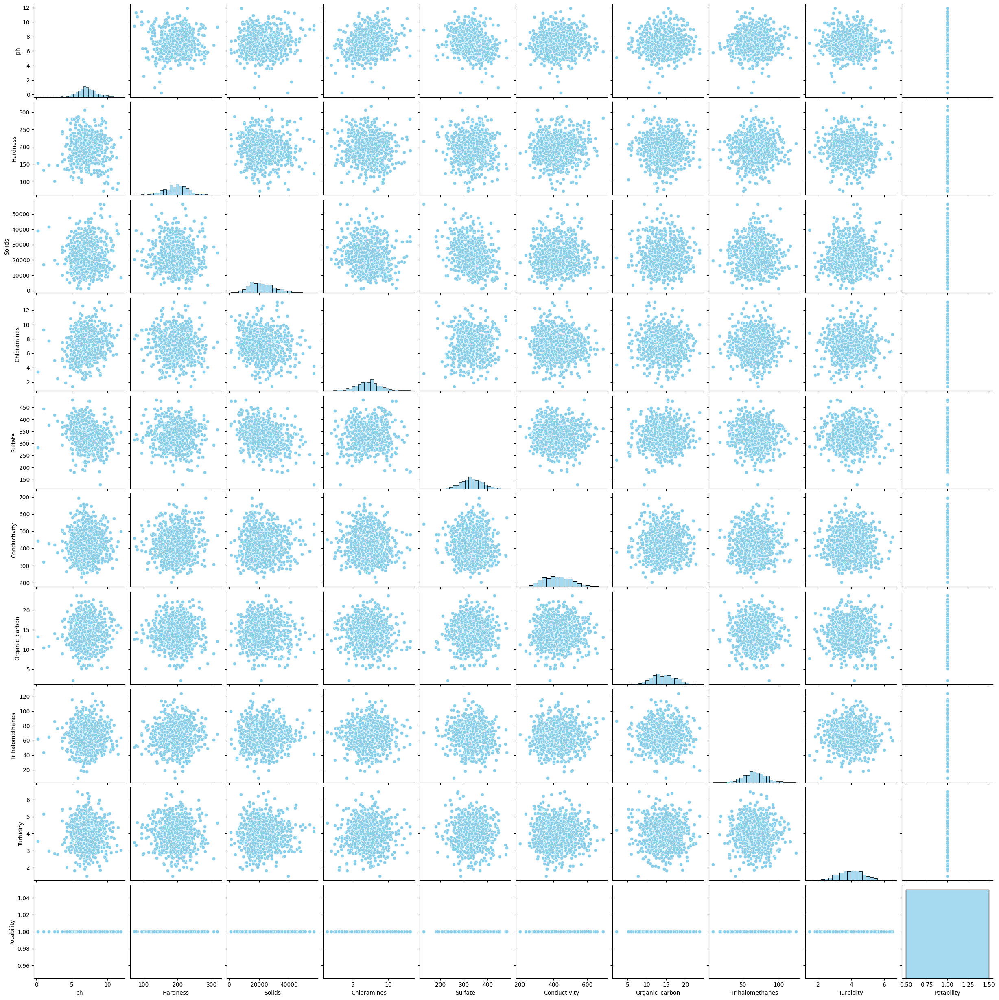

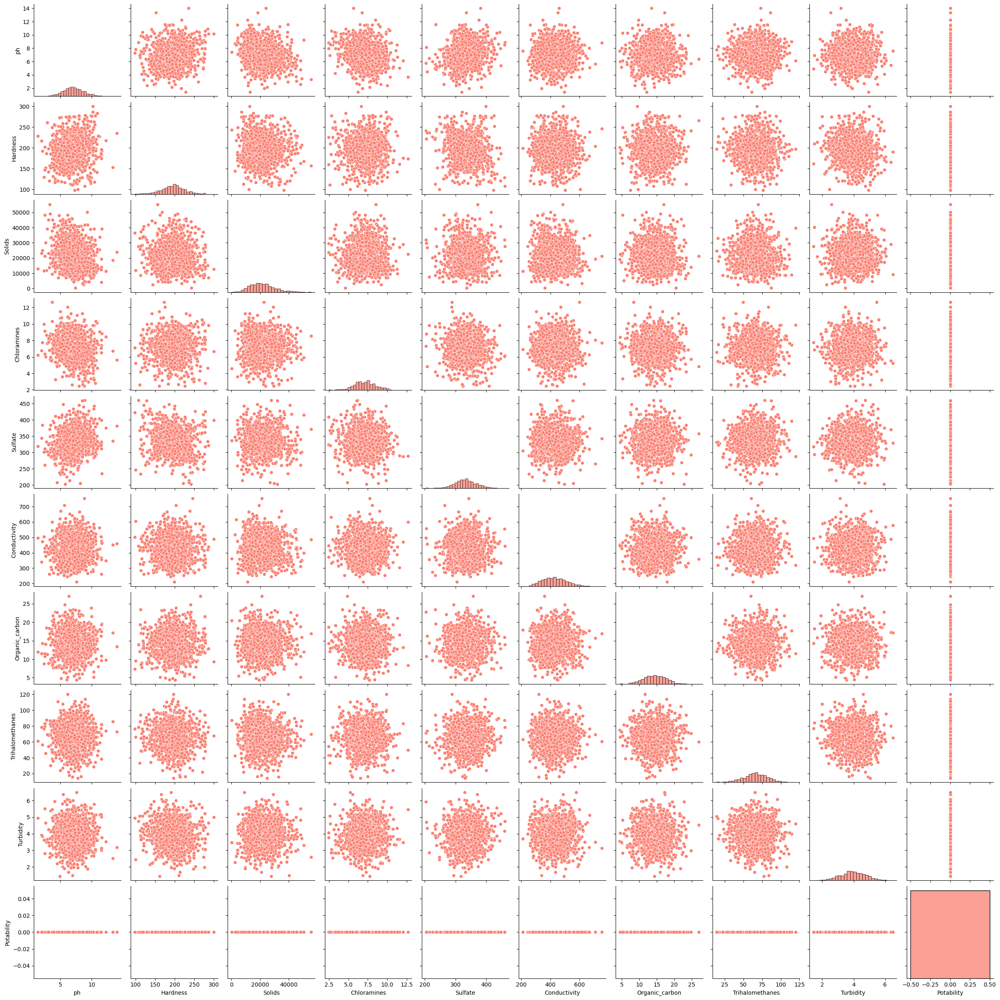

In [70]:

import plotly.express as px


# Define custom palette for both pairplots
custom_palette_one = ['skyblue'] * len(potability_one_df.columns)
custom_palette_zero = ['salmon'] * len(potability_zero_df.columns)

# Set the custom palette for both pairplots
sns.set_palette(custom_palette_one)
pairplot_one = sns.pairplot(potability_one_df)

sns.set_palette(custom_palette_zero)
pairplot_zero = sns.pairplot(potability_zero_df)

# Convert pairplots to Plotly figures
fig_one = px.scatter_matrix(potability_one_df)
fig_zero = px.scatter_matrix(potability_zero_df)



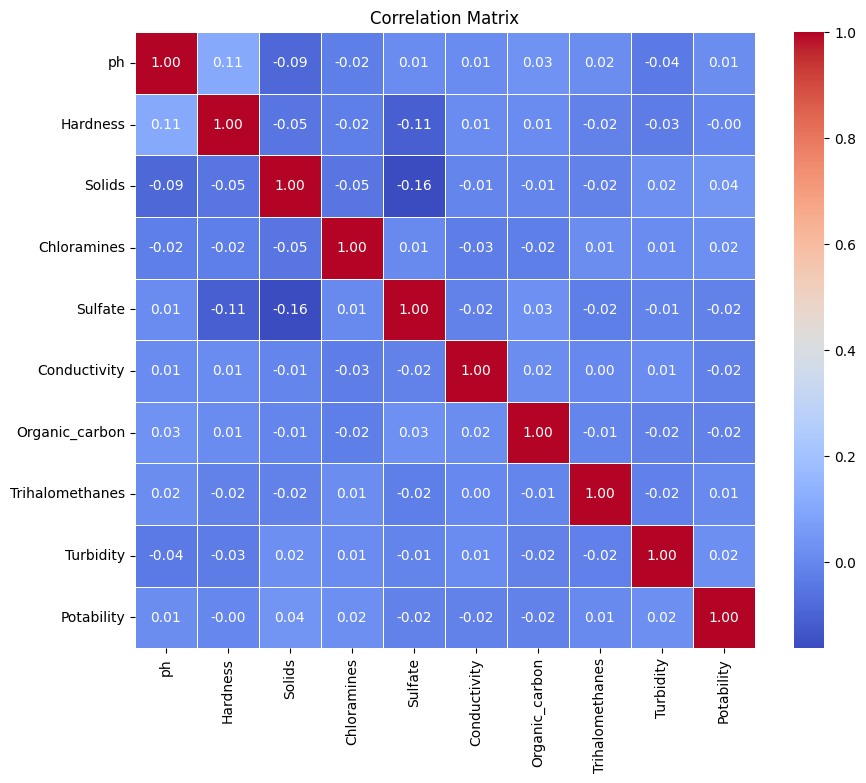

In [71]:




# Calculate correlation matrix
correlation_matrix = df1.corr()

# Visualize correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


<Figure size 1000x600 with 0 Axes>

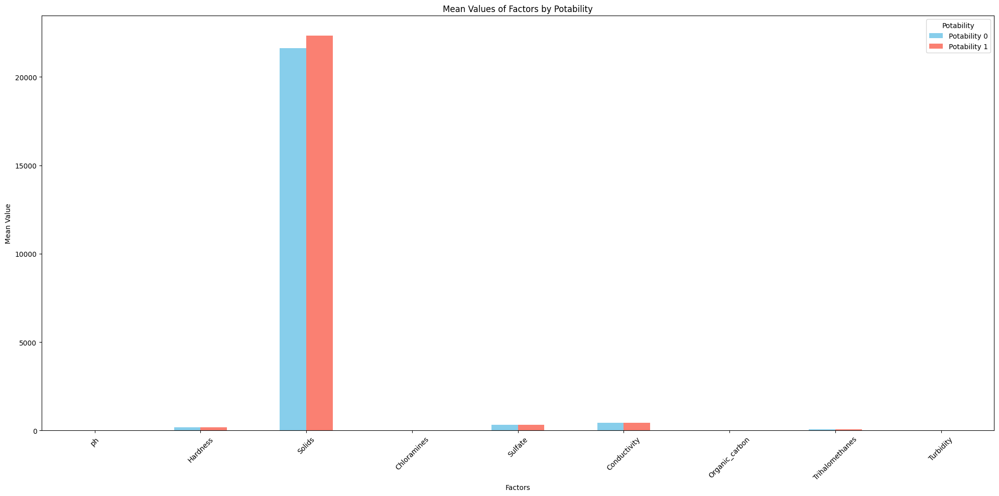

In [72]:



# Group the data by 'Potability' and calculate the mean for each factor
grouped_data = df1.groupby('Potability').mean()

# Transpose the grouped data to have factors as columns
grouped_data = grouped_data.T

# Plot the bar chart
plt.figure(figsize=(10, 6))  # Set the figure size
grouped_data.plot(kind='bar', color=['skyblue', 'salmon'])  # Plot bars for both potability 0 and 1
plt.title('Mean Values of Factors by Potability')
plt.xlabel('Factors')
plt.ylabel('Mean Value')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Potability', labels=['Potability 0', 'Potability 1'])  # Add legend
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


C:\Users\Shaminda Kanchana\AppData\Local\Temp\ipykernel_2752\2005950172.py:7: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



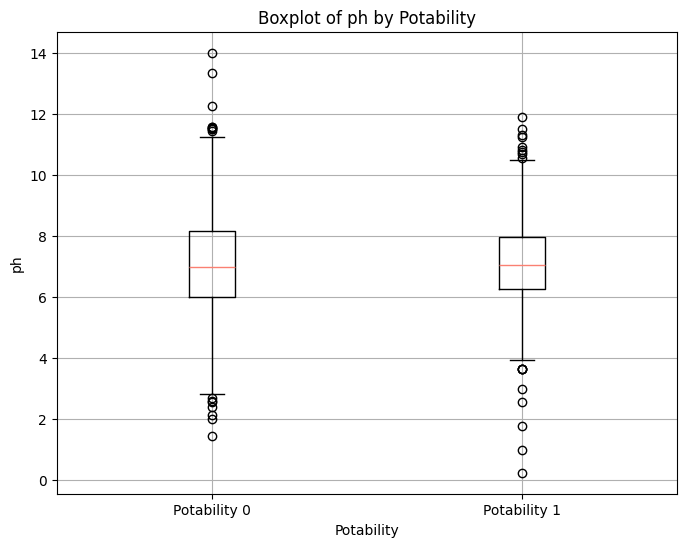

C:\Users\Shaminda Kanchana\AppData\Local\Temp\ipykernel_2752\2005950172.py:18: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



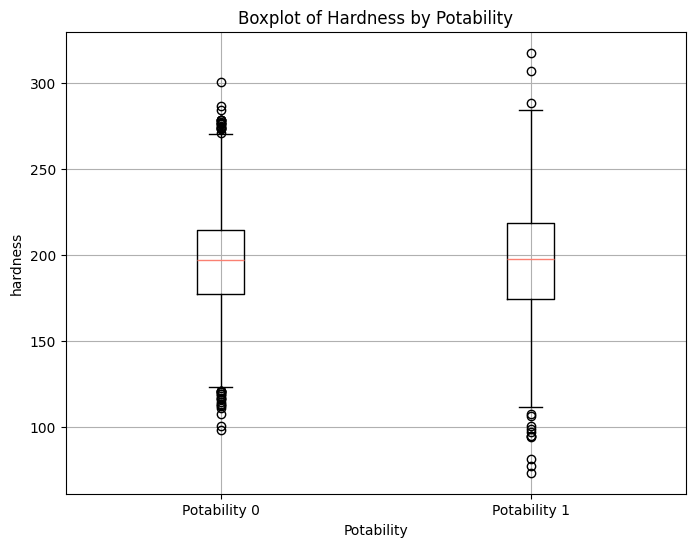

C:\Users\Shaminda Kanchana\AppData\Local\Temp\ipykernel_2752\2005950172.py:27: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



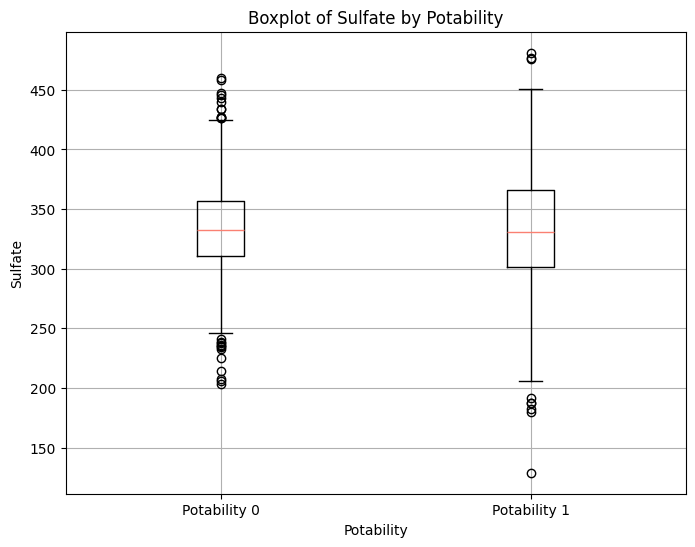

C:\Users\Shaminda Kanchana\AppData\Local\Temp\ipykernel_2752\2005950172.py:37: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



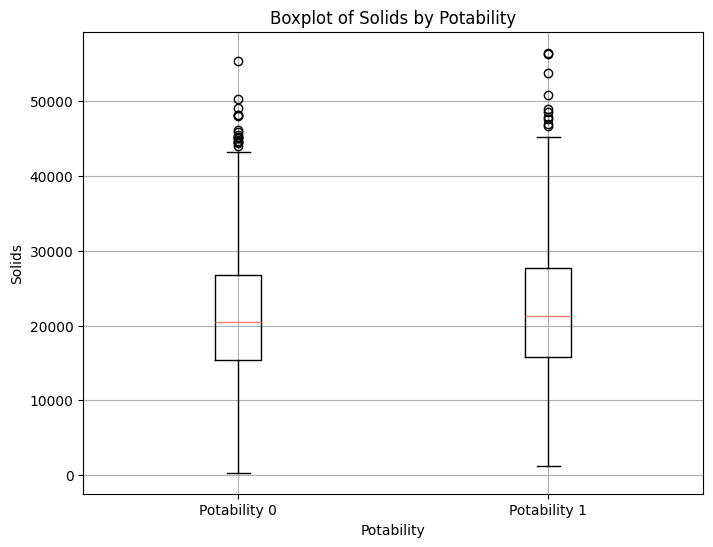

C:\Users\Shaminda Kanchana\AppData\Local\Temp\ipykernel_2752\2005950172.py:47: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



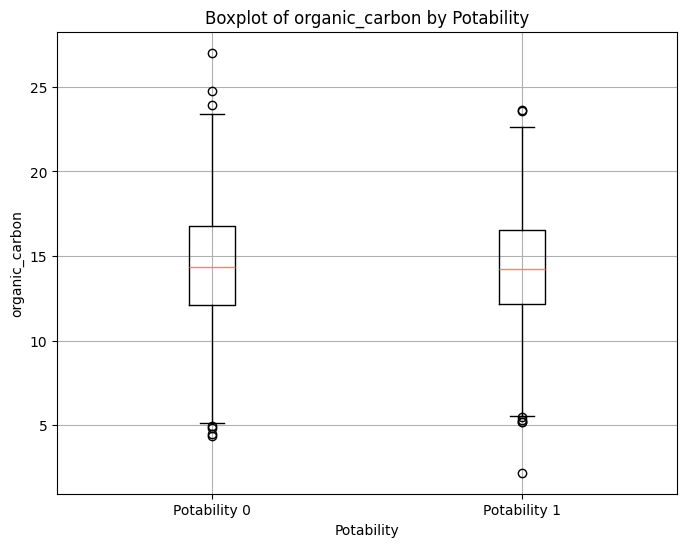

In [73]:


# Filter the data for potability 0 and 1
potability_0_data = df1[df1['Potability'] == 0]
potability_1_data = df1[df1['Potability'] == 1]

# Create boxplots for each potability group
plt.figure(figsize=(8, 6))  # Set the figure size
plt.boxplot([potability_0_data['ph'], potability_1_data['ph']], labels=['Potability 0', 'Potability 1'])
plt.title('Boxplot of ph by Potability')
plt.xlabel('Potability')
plt.ylabel('ph')
plt.grid(True)
plt.show()



# Create boxplots for each potability group
plt.figure(figsize=(8, 6))  # Set the figure size
plt.boxplot([potability_0_data['Hardness'], potability_1_data['Hardness']], labels=['Potability 0', 'Potability 1'])
plt.title('Boxplot of Hardness by Potability')
plt.xlabel('Potability')
plt.ylabel('hardness')
plt.grid(True)
plt.show()

# Create boxplots for each potability group
plt.figure(figsize=(8, 6))  # Set the figure size
plt.boxplot([potability_0_data['Sulfate'], potability_1_data['Sulfate']], labels=['Potability 0', 'Potability 1'])
plt.title('Boxplot of Sulfate by Potability')
plt.xlabel('Potability')
plt.ylabel('Sulfate')
plt.grid(True)
plt.show()


# Create boxplots for each potability group
plt.figure(figsize=(8, 6))  # Set the figure size
plt.boxplot([potability_0_data['Solids'], potability_1_data['Solids']], labels=['Potability 0', 'Potability 1'])
plt.title('Boxplot of Solids by Potability')
plt.xlabel('Potability')
plt.ylabel('Solids')
plt.grid(True)
plt.show()


# Create boxplots for each potability group
plt.figure(figsize=(8, 6))  # Set the figure size
plt.boxplot([potability_0_data['Organic_carbon'], potability_1_data['Organic_carbon']], labels=['Potability 0', 'Potability 1'])
plt.title('Boxplot of organic_carbon by Potability')
plt.xlabel('Potability')
plt.ylabel('organic_carbon')
plt.grid(True)
plt.show()


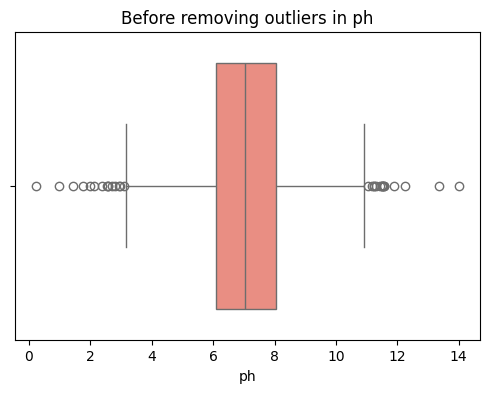

In [74]:
df1.head(1)
plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in ph')
sns.boxplot(data=df1,x="ph")
plt.show()

In [75]:
df1.count()

ph                 2011
Hardness           2011
Solids             2011
Chloramines        2011
Sulfate            2011
Conductivity       2011
Organic_carbon     2011
Trihalomethanes    2011
Turbidity          2011
Potability         2011
dtype: int64

Upper limit 10.990000000000002
Lower limit 3.1499999999999986


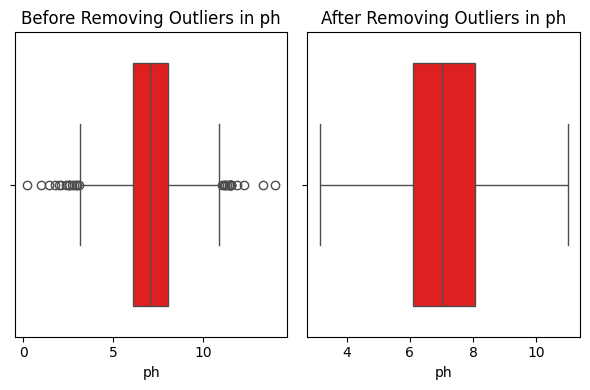

In [76]:
#remove outliers in ph 
q1=df1["ph"].quantile(.25)
q3=df1["ph"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['ph']>upper_limit),'ph']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['ph']<lower_limit),'ph']=lower_limit

#df1_no_outliers = df1[(df1["ph"] >= lower_limit) & (df1["ph"] <= upper_limit)]
df1_no_outliers.describe()


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in ph')
sns.boxplot(data=df1, x="ph",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in ph')
sns.boxplot(data=df1_no_outliers, x="ph",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


<Axes: title={'center': 'ph'}, xlabel='ph', ylabel='Count'>

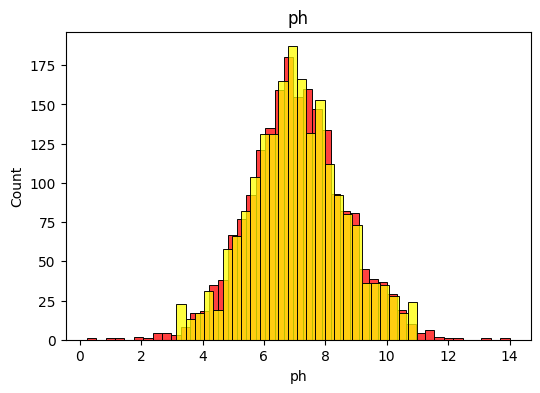

In [77]:
plt.figure(figsize=(6, 4))
plt.title('ph')
sns.histplot(data=df1,x="ph",color="red")
sns.histplot(data=df1_no_outliers,x="ph",color="yellow")

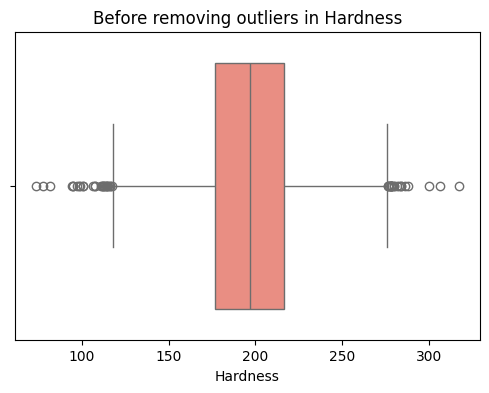

In [78]:
df1.head(1)
plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in Hardness')
sns.boxplot(data=df1,x="Hardness")
plt.show()

Upper limit 275.98249999999996
Lower limit 117.20250000000001


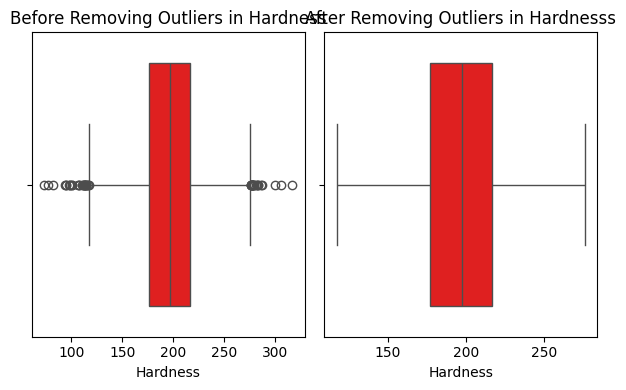

In [79]:
#remove outliers in Hardness 
q1=df1["Hardness"].quantile(.25)
q3=df1["Hardness"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['Hardness']>upper_limit),'Hardness']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['Hardness']<lower_limit),'Hardness']=lower_limit


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in Hardness')
sns.boxplot(data=df1, x="Hardness",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in Hardnesss')
sns.boxplot(data=df1_no_outliers, x="Hardness",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


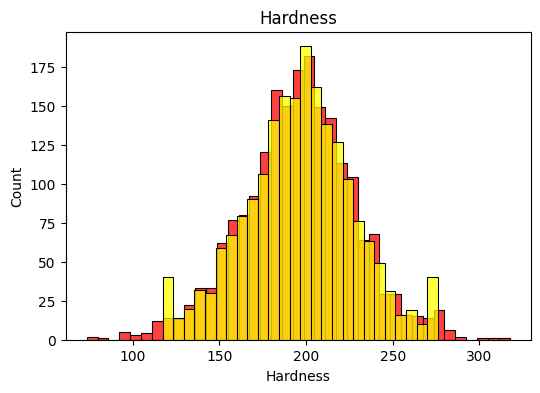

In [80]:



plt.figure(figsize=(6, 4))
plt.title('Hardness')
sns.histplot(data=df1,x="Hardness",color="red")
sns.histplot(data=df1_no_outliers,x="Hardness",color="yellow")

plt.show()

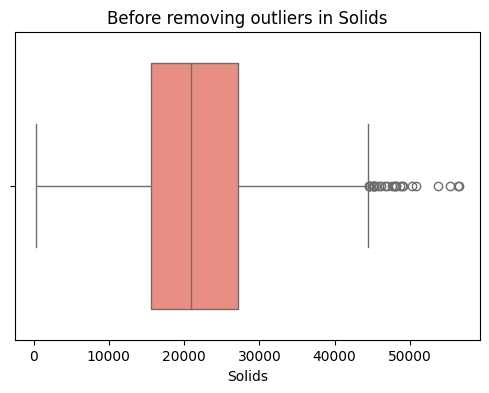

In [81]:
df1.head(1)
plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in Solids')
sns.boxplot(data=df1,x="Solids")
plt.show()

Upper limit 44532.965
Lower limit -1734.7149999999965


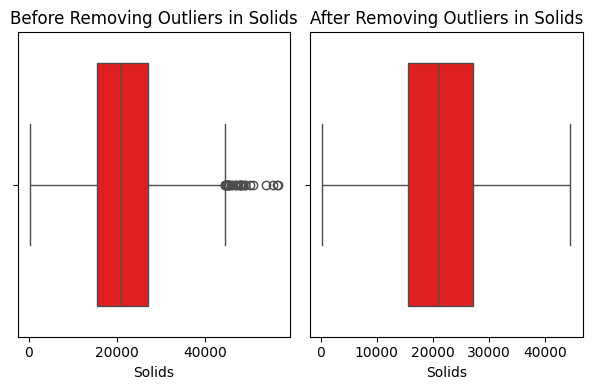

In [82]:
#remove outliers in Solids
q1=df1["Solids"].quantile(.25)
q3=df1["Solids"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['Solids']>upper_limit),'Solids']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['Solids']<lower_limit),'Solids']=lower_limit


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in Solids')
sns.boxplot(data=df1, x="Solids",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in Solids')
sns.boxplot(data=df1_no_outliers, x="Solids",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


<Axes: title={'center': 'Solids'}, xlabel='Solids', ylabel='Count'>

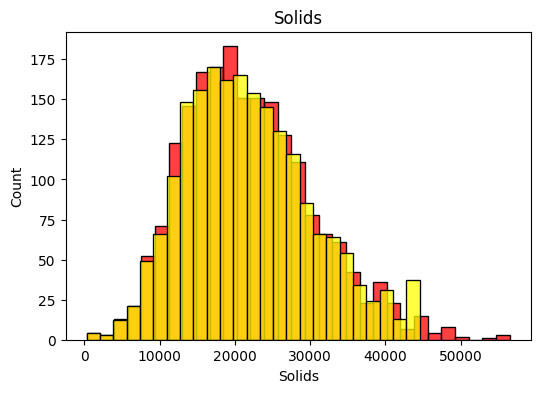

In [83]:
plt.figure(figsize=(6, 4))
plt.title('Solids')
sns.histplot(data=df1,x="Solids",color="red")
sns.histplot(data=df1_no_outliers,x="Solids",color="yellow")

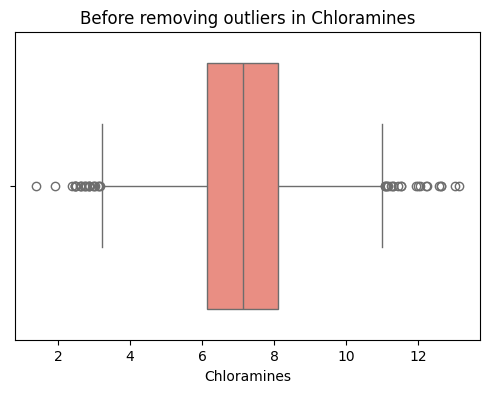

In [84]:
df1.head(1)
plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in Chloramines')
sns.boxplot(data=df1,x="Chloramines")
plt.show()

Upper limit 11.065
Lower limit 3.185


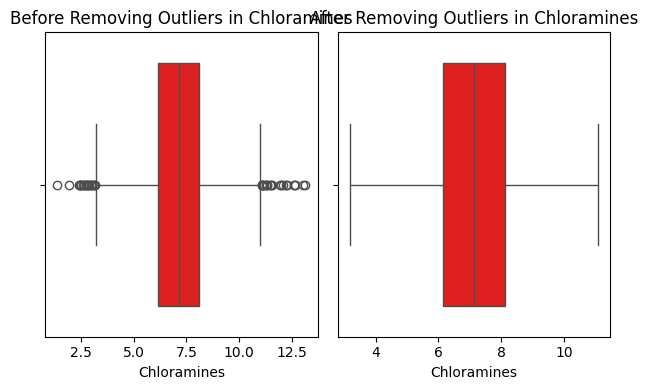

In [85]:
#remove outliers in Chloramines
q1=df1["Chloramines"].quantile(.25)
q3=df1["Chloramines"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['Chloramines']>upper_limit),'Chloramines']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['Chloramines']<lower_limit),'Chloramines']=lower_limit


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in Chloramines')
sns.boxplot(data=df1, x="Chloramines",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in Chloramines')
sns.boxplot(data=df1_no_outliers, x="Chloramines",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


<Axes: title={'center': 'Chloramines'}, xlabel='Chloramines', ylabel='Count'>

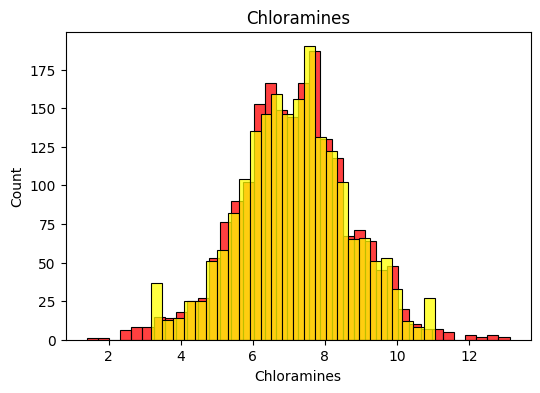

In [86]:
plt.figure(figsize=(6, 4))
plt.title('Chloramines')
sns.histplot(data=df1,x="Chloramines",color="red")
sns.histplot(data=df1_no_outliers,x="Chloramines",color="yellow")

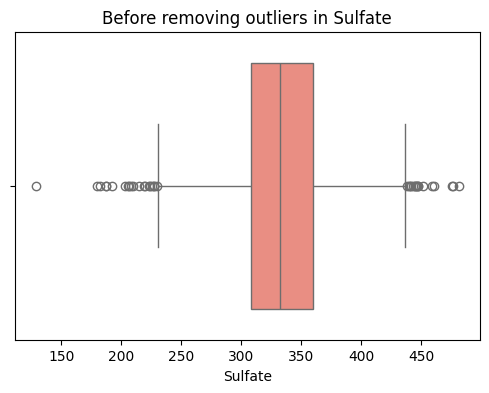

In [87]:
df1.head(1)
plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in Sulfate')
sns.boxplot(data=df1,x="Sulfate")
plt.show()

Upper limit 436.88
Lower limit 230.08


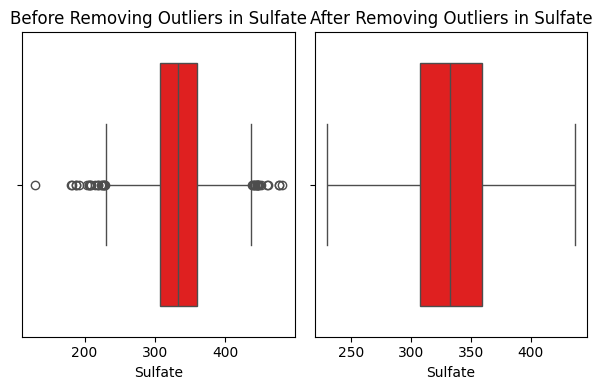

In [88]:
#remove outliers in Sulfate
q1=df1["Sulfate"].quantile(.25)
q3=df1["Sulfate"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['Sulfate']>upper_limit),'Sulfate']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['Sulfate']<lower_limit),'Sulfate']=lower_limit


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in Sulfate')
sns.boxplot(data=df1, x="Sulfate",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in Sulfate')
sns.boxplot(data=df1_no_outliers, x="Sulfate",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


<Axes: title={'center': 'Sulfate'}, xlabel='Sulfate', ylabel='Count'>

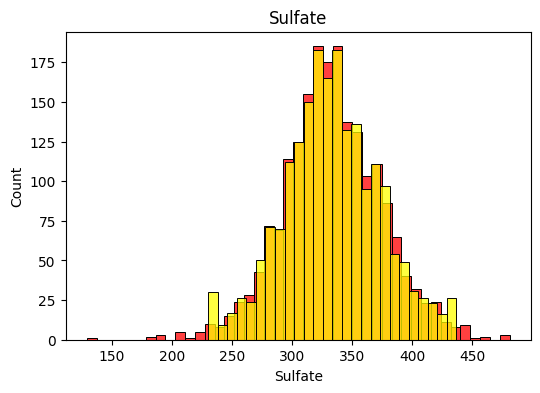

In [89]:
plt.figure(figsize=(6, 4))
plt.title('Sulfate')
sns.histplot(data=df1,x="Sulfate",color="red")
sns.histplot(data=df1_no_outliers,x="Sulfate",color="yellow")

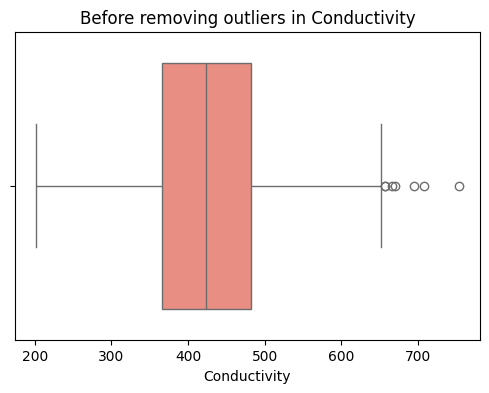

In [90]:
df1.head(1)
plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in Conductivity')
sns.boxplot(data=df1,x="Conductivity")
plt.show()

Upper limit 655.905
Lower limit 193.145


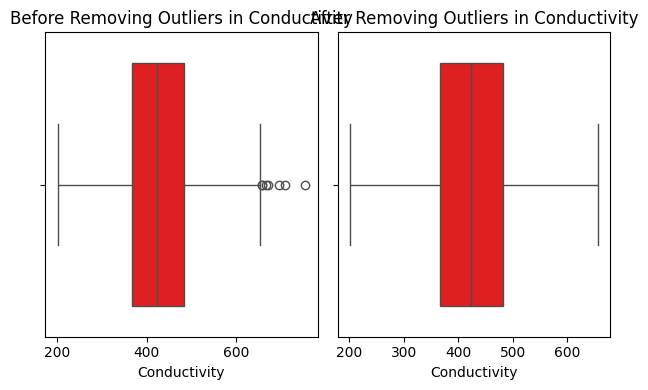

In [91]:
#remove outliers in Sulfate
q1=df1["Conductivity"].quantile(.25)
q3=df1["Conductivity"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['Conductivity']>upper_limit),'Conductivity']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['Conductivity']<lower_limit),'Conductivity']=lower_limit


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in Conductivity')
sns.boxplot(data=df1, x="Conductivity",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in Conductivity')
sns.boxplot(data=df1_no_outliers, x="Conductivity",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


<Axes: title={'center': 'Conductivity'}, xlabel='Conductivity', ylabel='Count'>

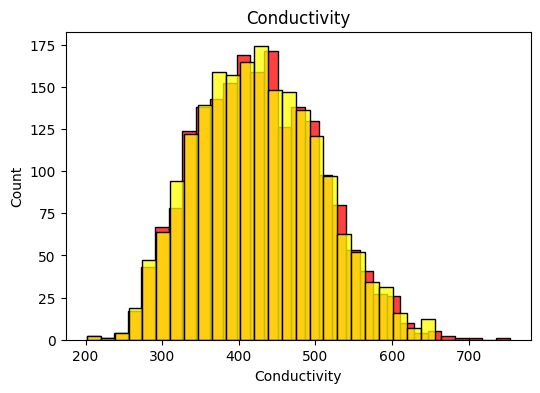

In [92]:
plt.figure(figsize=(6, 4))
plt.title('Conductivity')
sns.histplot(data=df1,x="Conductivity",color="red")
sns.histplot(data=df1_no_outliers,x="Conductivity",color="yellow")

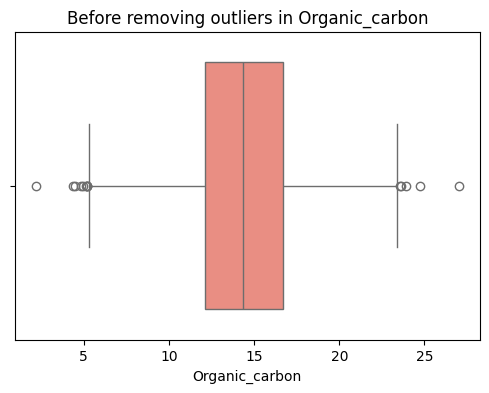

In [93]:
df1.head(1)
plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in Organic_carbon')
sns.boxplot(data=df1,x="Organic_carbon")
plt.show()

Upper limit 23.5125
Lower limit 5.2925


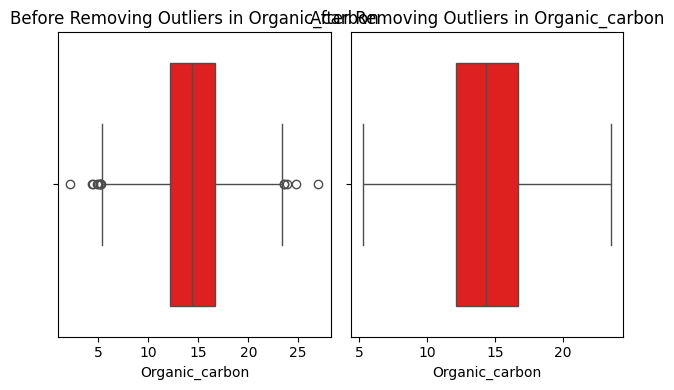

In [94]:
#remove outliers in Organic_carbon
q1=df1["Organic_carbon"].quantile(.25)
q3=df1["Organic_carbon"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['Organic_carbon']>upper_limit),'Organic_carbon']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['Organic_carbon']<lower_limit),'Organic_carbon']=lower_limit


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in Organic_carbon')
sns.boxplot(data=df1, x="Organic_carbon",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in Organic_carbon')
sns.boxplot(data=df1_no_outliers, x="Organic_carbon",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


<Axes: title={'center': 'Organic_carbon'}, xlabel='Organic_carbon', ylabel='Count'>

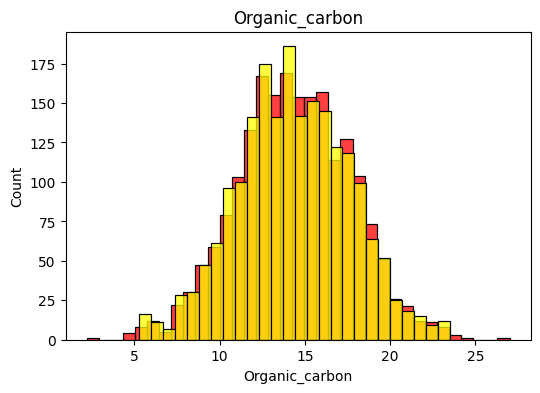

In [95]:
plt.figure(figsize=(6, 4))
plt.title('Organic_carbon')
sns.histplot(data=df1,x="Organic_carbon",color="red")
sns.histplot(data=df1_no_outliers,x="Organic_carbon",color="yellow")

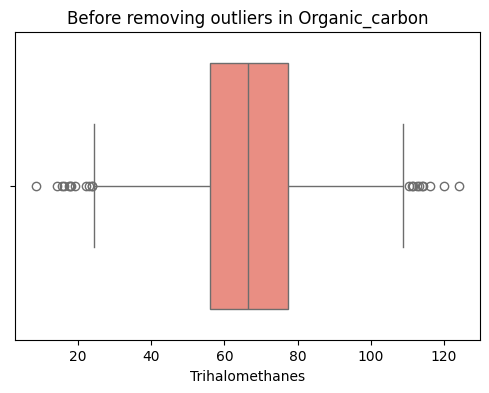

In [96]:

plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in Organic_carbon')
sns.boxplot(data=df1,x="Trihalomethanes")
plt.show()

Upper limit 109.305
Lower limit 23.944999999999993


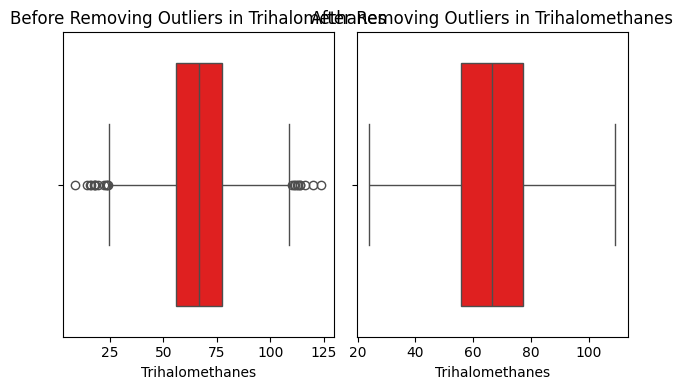

In [97]:
#remove outliers in Trihalomethanes
q1=df1["Trihalomethanes"].quantile(.25)
q3=df1["Trihalomethanes"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['Trihalomethanes']>upper_limit),'Trihalomethanes']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['Trihalomethanes']<lower_limit),'Trihalomethanes']=lower_limit


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in Trihalomethanes')
sns.boxplot(data=df1, x="Trihalomethanes",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in Trihalomethanes')
sns.boxplot(data=df1_no_outliers, x="Trihalomethanes",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


<Axes: title={'center': 'Trihalomethanes'}, xlabel='Trihalomethanes', ylabel='Count'>

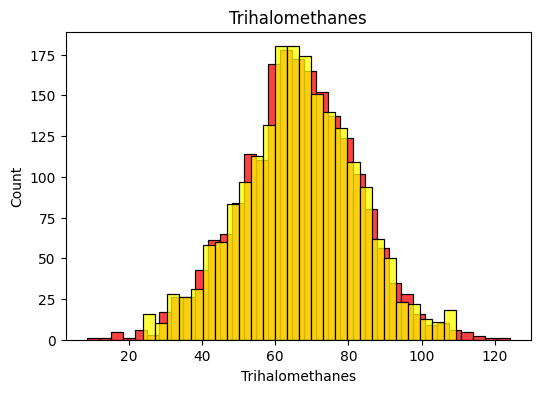

In [98]:
plt.figure(figsize=(6, 4))
plt.title('Trihalomethanes')
sns.histplot(data=df1,x="Trihalomethanes",color="red")
sns.histplot(data=df1_no_outliers,x="Trihalomethanes",color="yellow")

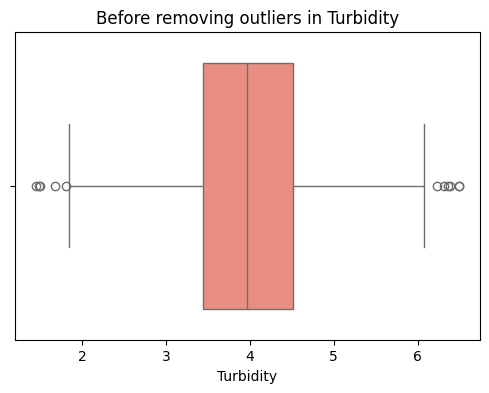

In [99]:
plt.figure(figsize=(6, 4))
plt.title('Before removing outliers in Turbidity')
sns.boxplot(data=df1,x="Turbidity")
plt.show()

Upper limit 6.1274999999999995
Lower limit 1.8275000000000003


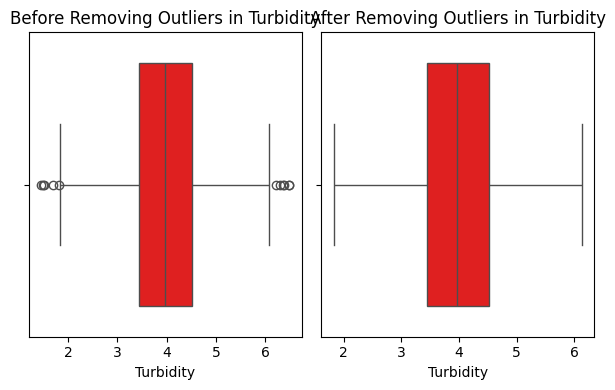

In [100]:
#remove outliers in Turbidity
q1=df1["Turbidity"].quantile(.25)
q3=df1["Turbidity"].quantile(.75)
iqr=q3-q1
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)


df1_no_outliers =df1.copy()
df1_no_outliers .loc[(df1_no_outliers['Turbidity']>upper_limit),'Turbidity']=upper_limit
df1_no_outliers .loc[(df1_no_outliers['Turbidity']<lower_limit),'Turbidity']=lower_limit


# First subplot: Before removing outliers
plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, this is the first plot
plt.title('Before Removing Outliers in Turbidity')
sns.boxplot(data=df1, x="Turbidity",color="red")

# Second subplot: After removing outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, this is the second plot
plt.title('After Removing Outliers in Turbidity')
sns.boxplot(data=df1_no_outliers, x="Turbidity",color="red")

# Display the plots
plt.tight_layout()  # Adjusts spacing to avoid overlap
plt.show()


<Axes: title={'center': 'Turbidity'}, xlabel='Turbidity', ylabel='Count'>

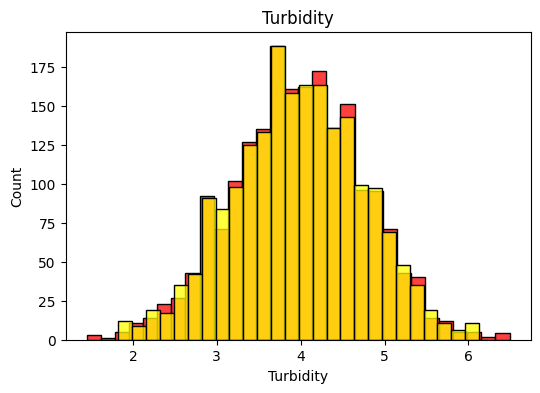

In [101]:
plt.figure(figsize=(6, 4))
plt.title('Turbidity')
sns.histplot(data=df1,x="Turbidity",color="red")
sns.histplot(data=df1_no_outliers,x="Turbidity",color="yellow")

In [102]:
df1.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.32,214.37,22018.42,8.06,356.89,363.27,18.44,100.34,4.63,0
4,9.09,181.10,17978.99,6.55,310.14,398.41,11.56,32.00,4.08,0
5,5.58,188.31,28748.69,7.54,326.68,280.47,8.40,54.92,2.56,0
6,10.22,248.07,28749.72,7.51,393.66,283.65,13.79,84.60,2.67,0
7,8.64,203.36,13672.09,4.56,303.31,474.61,12.36,62.80,4.40,0


In [103]:
from sklearn.preprocessing import StandardScaler 

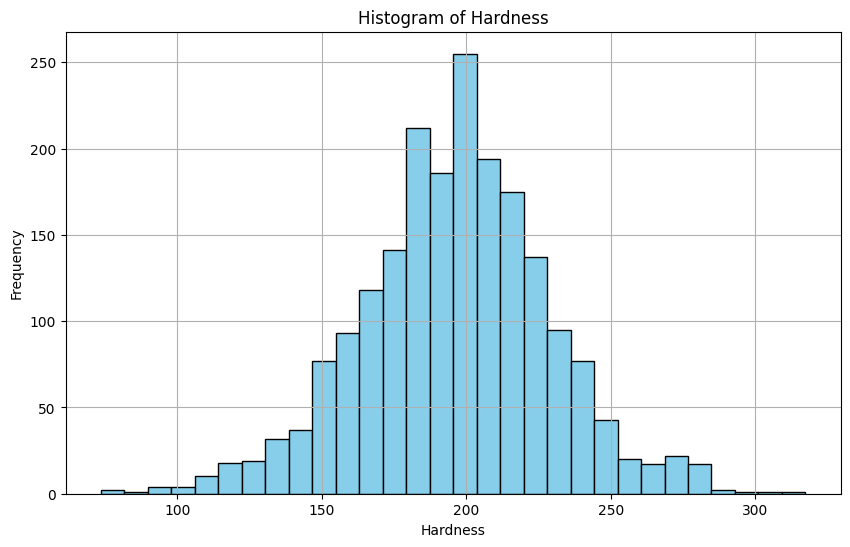

In [104]:


# Assuming df is your DataFrame containing the dataset

# Plot histogram of 'Hardness'
plt.figure(figsize=(10, 6))
plt.hist(df1['Hardness'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Hardness')
plt.xlabel('Hardness')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


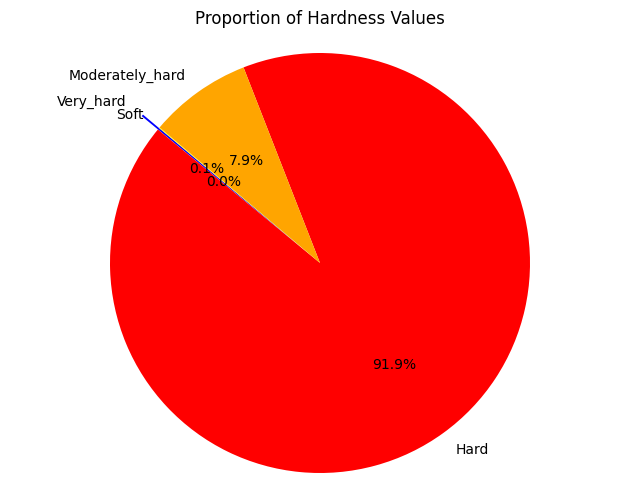

In [105]:

Very_hard = (df1['Hardness'] > 300).sum()
Hard = ((df1['Hardness'] <= 300) & (df1['Hardness'] > 151)).sum()
Moderately_hard = ((df1['Hardness'] <= 151) & (df1['Hardness'] > 76)).sum()
Soft = len(df1) - (Very_hard + Hard + Moderately_hard)

# Create data for the pie chart
sizes = [Very_hard, Hard, Moderately_hard, Soft]
labels = ['Very_hard', 'Hard', 'Moderately_hard', 'Soft']
colors = ['blue', 'red', 'orange', 'yellow']
explode = (0.1, 0, 0, 0)  # Explode the 'Very_hard' slice

# Plot the pie chart
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, colors=colors, explode=explode, autopct='%1.1f%%', startangle=140)
plt.title('Proportion of Hardness Values')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()


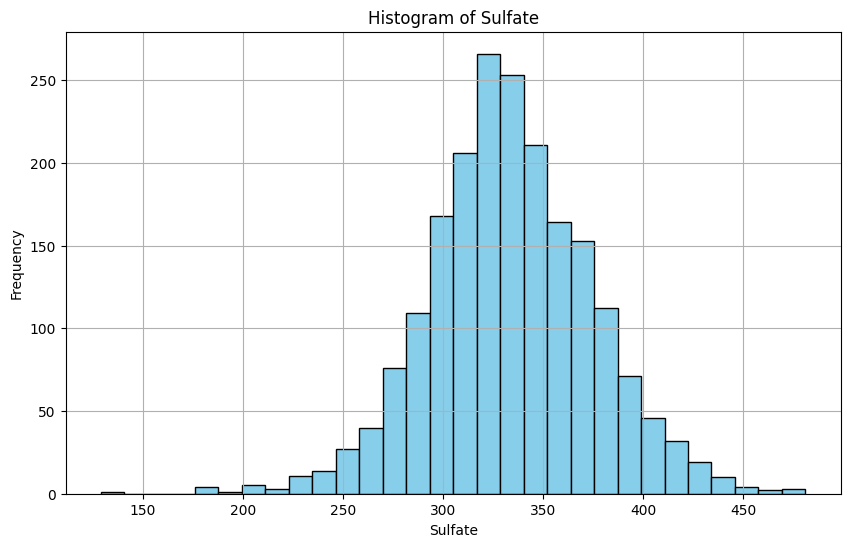

In [106]:
plt.figure(figsize=(10, 6))
plt.hist(df1['Sulfate'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Sulfate')
plt.xlabel('Sulfate')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


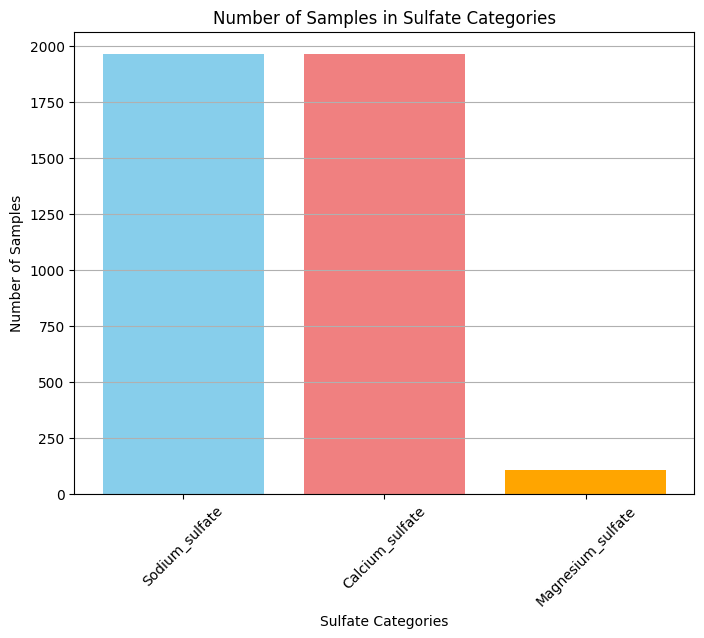

In [107]:




Sodium_sulfate = ((df1['Sulfate'] <= 500) & (df1['Sulfate'] >=250)).sum()
Calcium_sulfate = ((df1['Sulfate'] <= 1000) & (df1['Sulfate'] >=250)).sum()
Magnesium_sulfate = ((df1['Sulfate'] <= 600) & (df1['Sulfate'] >=400)).sum()

# Create data for the bar chart
categories = ['Sodium_sulfate', 'Calcium_sulfate',  'Magnesium_sulfate']
values = [Sodium_sulfate,Calcium_sulfate,Magnesium_sulfate]

# Plot the bar chart
plt.figure(figsize=(8, 6))
plt.bar(categories, values, color=['skyblue', 'lightcoral', 'orange', 'lightgreen'])

plt.title('Number of Samples in Sulfate Categories')
plt.xlabel('Sulfate Categories')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y')  # Add gridlines along the y-


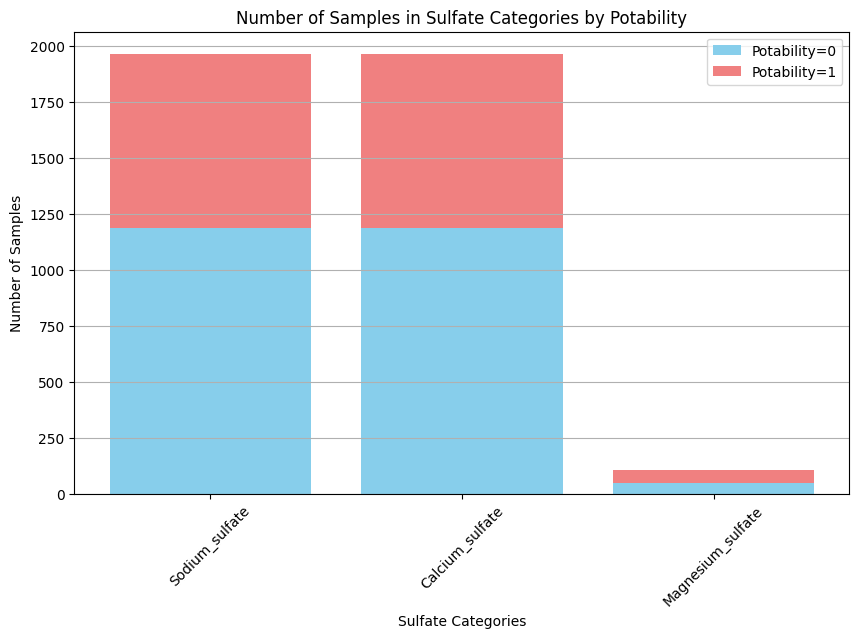

In [108]:

# Count the number of values in different sulfate categories
Sodium_sulfate = ((df1['Sulfate'] <= 500) & (df1['Sulfate'] >= 250)).sum()
Calcium_sulfate = ((df1['Sulfate'] <= 1000) & (df1['Sulfate'] >= 250)).sum()
Magnesium_sulfate = ((df1['Sulfate'] <= 600) & (df1['Sulfate'] >= 400)).sum()

# Count the number of samples with potability=0 in each sulfate category
potability_zero_Sodium_sulfate = ((df1['Sulfate'] <= 500) & (df1['Sulfate'] >= 250) & (df1['Potability'] == 0)).sum()
potability_zero_Calcium_sulfate = ((df1['Sulfate'] <= 1000) & (df1['Sulfate'] >= 250) & (df1['Potability'] == 0)).sum()
potability_zero_Magnesium_sulfate = ((df1['Sulfate'] <= 600) & (df1['Sulfate'] >= 400) & (df1['Potability'] == 0)).sum()

# Create data for the bar chart
categories = ['Sodium_sulfate', 'Calcium_sulfate', 'Magnesium_sulfate']
values_potability_zero = [potability_zero_Sodium_sulfate, potability_zero_Calcium_sulfate, potability_zero_Magnesium_sulfate]
values_potability_one = [Sodium_sulfate - potability_zero_Sodium_sulfate, Calcium_sulfate - potability_zero_Calcium_sulfate, Magnesium_sulfate - potability_zero_Magnesium_sulfate]

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(categories, values_potability_zero, color='skyblue', label='Potability=0')
plt.bar(categories, values_potability_one, bottom=values_potability_zero, color='lightcoral', label='Potability=1')
plt.title('Number of Samples in Sulfate Categories by Potability')
plt.xlabel('Sulfate Categories')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()  # Show legend
plt.grid(axis='y')  # Add gridlines along the y-axis
plt.show()


In [109]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [110]:
#regression analysis
scale_sandard=StandardScaler()
scale_normalized=MinMaxScaler()

In [111]:
df_standardrized=df1_no_outliers.copy()
df_normalized=df1_no_outliers.copy()

In [112]:
df1.head(1)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.32,214.37,22018.42,8.06,356.89,363.27,18.44,100.34,4.63,0


In [113]:
columns_to_standardize = ['ph','Hardness','Solids','Chloramines','Sulfate','Conductivity','Organic_carbon','Trihalomethanes','Turbidity','Potability']
df_standardrized[columns_to_standardize] = scale_sandard.fit_transform(df1_no_outliers[columns_to_standardize])
df_normalized[columns_to_standardize] = scale_normalized.fit_transform(df1_no_outliers[columns_to_standardize])


In [114]:
df_standardrized.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,0.784486,0.564012,0.011687,0.584254,0.574471,-0.783919,1.228062,2.111557,0.851027,-0.822091
4,1.273995,-0.455698,-0.455834,-0.368771,-0.560376,-0.348439,-0.841612,-2.140282,0.142365,-0.822091
5,-0.957406,-0.234715,0.790645,0.256060,-0.158870,-1.810035,-1.792218,-0.714293,-1.816119,-0.822091
6,1.992367,1.596902,0.790765,0.237126,1.467056,-1.770627,-0.170773,1.132277,-1.674386,-0.822091
7,0.987918,0.226561,-0.954313,-1.624746,-0.726173,0.595885,-0.600952,-0.224031,0.554677,-0.822091


In [115]:
df_normalized.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,0.587509,0.577732,0.386298,0.568143,0.647360,0.292993,0.654575,0.795010,0.651744,0.0
4,0.643428,0.441296,0.314381,0.439523,0.514558,0.356685,0.377267,0.202911,0.523837,0.0
5,0.388526,0.470863,0.506122,0.523850,0.561543,0.142917,0.249899,0.401490,0.170349,0.0
6,0.725490,0.715932,0.506141,0.521295,0.751811,0.148680,0.467150,0.658638,0.195930,0.0
7,0.610748,0.532582,0.237701,0.270017,0.495157,0.494798,0.409512,0.469763,0.598256,0.0


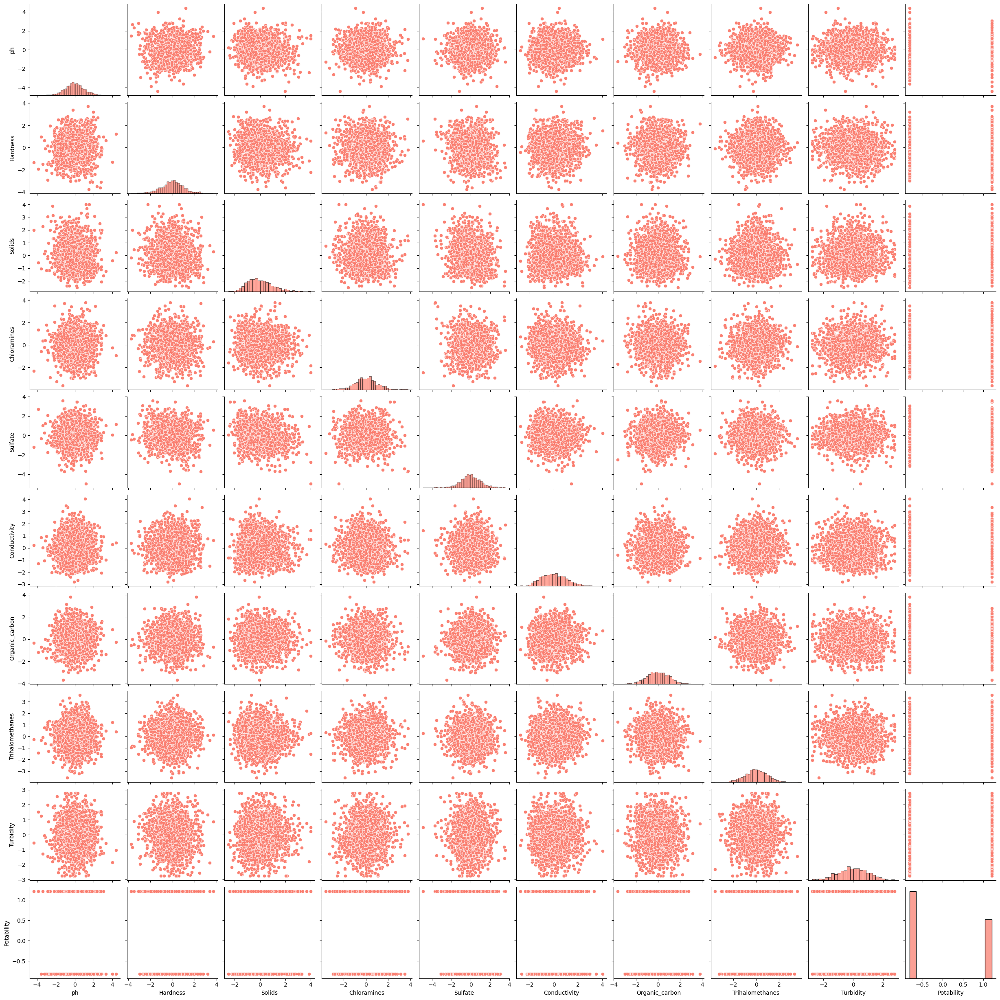

In [116]:
# Generate pairplot for all numerical variables
sns.pairplot(df_standardrized)
plt.show()

In [117]:
# Generate pairplot for all numerical variables
sns.pairplot(df_normalized)
plt.show()

In [ ]:
sns.scatterplot(data=df_standardrized,x="ph",y="Potability")
df_standardrized.head(2)

In [ ]:
df_standardrized.columns.to_list()

In [251]:
#Perform logistic regression 
X=df_normalized[['Solids']]
y=df1_no_outliers['Potability']


In [252]:
#Split the dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [ ]:
X_train.shape

In [ ]:
#Perform logistic regerssion
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
log_reg=LogisticRegression()
log_reg.fit(X_train,y_train)

In [261]:
#Make prediction using the model
#perform prediction using the test dataset
y_pred=log_reg.predict(X_test)


In [ ]:
#display the confusion matrix
confusion_matrix(y_test,y_pred)

In [ ]:
y_test.shape
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(X_test,y_pred, color='blue', label='Logistic Regression Curve')


In [ ]:



target = 'Potability'  

# Calculate correlations
correlations = df1_no_outliers.corr()[target]

# Print correlations
print(correlations)


In [ ]:
df1_no_outliers.head()

In [288]:
X=df1_no_outliers[['ph','Hardness','Solids','Chloramines','Sulfate','Conductivity','Organic_carbon','Trihalomethanes','Turbidity']]
#Split the dataset

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [ ]:
#use random forest 
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_estimators=50)
rf.fit(X_train,y_train)

In [290]:
predrf=rf.predict(X_test)


In [ ]:
accuracy_score(y_test,predrf)

In [292]:
#Hyperparameter tuning 
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV


In [293]:
param_grid = {
    'n_estimators': [50, 100, 200],        # Number of trees
    'max_depth': [None, 10, 20, 30],       # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],        # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]           # Minimum number of samples required to be at a leaf node
}


In [294]:
rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)


In [ ]:
grid_search.fit(X_train, y_train)


In [ ]:
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print(f'Best Parameters: {best_params}')
print(f'Best Score: {best_score}')
